### Importamos librerias necesarias para el EDA:

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
from datetime import datetime
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### Carga y lectura de datos:

In [2]:
df = pd.read_csv('Datasets\AccidentesAviones.csv')
df.head()

,Unnamed: 0,fecha,HORA declarada,Ruta,OperadOR,flight_no,route,ac_type,registration,cn_ln,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary
0,0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,?,Demonstration,Wright Flyer III,?,1,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,1,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,?,Air show,Wright Byplane,SC1,?,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,2,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,?,Test flight,Dirigible,?,?,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,3,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,?,Curtiss seaplane,?,?,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,"September 09, 1913",1830,Over the North Sea,Military - German Navy,?,?,Zeppelin L-1 (airship),?,?,20,?,?,14,?,?,0,The airship flew into a thunderstorm and encou...


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5008 entries, 0 to 5007
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Unnamed: 0              5008 non-null   int64 
 1   fecha                   5008 non-null   object
 2   HORA declarada          5008 non-null   object
 3   Ruta                    5008 non-null   object
 4   OperadOR                5008 non-null   object
 5   flight_no               5008 non-null   object
 6   route                   5008 non-null   object
 7   ac_type                 5008 non-null   object
 8   registration            5008 non-null   object
 9   cn_ln                   5008 non-null   object
 10  all_aboard              5008 non-null   object
 11  PASAJEROS A BORDO       5008 non-null   object
 12  crew_aboard             5008 non-null   object
 13  cantidad de fallecidos  5008 non-null   object
 14  passenger_fatalities    5008 non-null   object
 15  crew

In [4]:
df.shape

(5008, 18)

### Features:

* `Unnamed`: indice
* `fecha`: fecha del accidente
* `HORA declarada`: hora declarada del accidente
* `Ruta`: contiene informacion del lugar del accidente
* `OperadOR`: operador o compania aerea a la que pertenece la aeronave
* `flight_no`: numero de vuelo
* `route`: plan de vuelo planificado
* `ac_type`: tipo de aeronave
* `registration`: numero de registro de la aeronave
* `cn_ln`: contiene informacion de la construccion y numero de linea de la aeronave
* `all_aboard`: total de personas en la aeronave (tripulacion y pasajeros)
* `PASAJEROS A BORDO`: total de pasajeros a bordo de la aeronave
* `crew_aboard`: tripulacion de la aeronave
* `cantidad de fallecidos`: cantidad de fallecidos en el accidente
* `passenger_fatalities`: cantidad de pasajeros fallecidos
* `crew_fatalities`: cantidad de la tripulacion fallecida en el accidente
* `grund`: corresponde a la cantidad de personas que no estaban en la aeronave que murieron a causa del accidente
* `summary`: descripcion del accidente y/o causa del mismo

### Busqueda de valores nulos:

In [5]:
#El false significa que no esta nulo y el true que esta nulo
df.isnull() #1 forma

,Unnamed: 0,fecha,HORA declarada,Ruta,OperadOR,flight_no,route,ac_type,registration,cn_ln,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5003,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5004,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5005,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5006,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [6]:
df.isnull().any()

Unnamed: 0                False
fecha                     False
HORA declarada            False
Ruta                      False
OperadOR                  False
flight_no                 False
route                     False
ac_type                   False
registration              False
cn_ln                     False
all_aboard                False
PASAJEROS A BORDO         False
crew_aboard               False
cantidad de fallecidos    False
passenger_fatalities      False
crew_fatalities           False
ground                    False
summary                   False
dtype: bool

In [7]:
df.isna().sum()

Unnamed: 0                0
fecha                     0
HORA declarada            0
Ruta                      0
OperadOR                  0
flight_no                 0
route                     0
ac_type                   0
registration              0
cn_ln                     0
all_aboard                0
PASAJEROS A BORDO         0
crew_aboard               0
cantidad de fallecidos    0
passenger_fatalities      0
crew_fatalities           0
ground                    0
summary                   0
dtype: int64

### Abrimos el archivo csv y detectamos que en lugar de valores nulos hay "?" en su lugar. Los ubicamos, reemplazamos y analizamos:

In [8]:
df.isin(["?"]).sum()

Unnamed: 0                   0
fecha                        0
HORA declarada            1504
Ruta                         5
OperadOR                    10
flight_no                 3682
route                      762
ac_type                     13
registration               272
cn_ln                      667
all_aboard                  17
PASAJEROS A BORDO          221
crew_aboard                219
cantidad de fallecidos       8
passenger_fatalities       235
crew_fatalities            235
ground                      44
summary                     59
dtype: int64

In [9]:
df.replace("?", np.nan, inplace=True)

In [10]:
df.isnull().sum()

Unnamed: 0                   0
fecha                        0
HORA declarada            1504
Ruta                         5
OperadOR                    10
flight_no                 3682
route                      762
ac_type                     13
registration               272
cn_ln                      667
all_aboard                  17
PASAJEROS A BORDO          221
crew_aboard                219
cantidad de fallecidos       8
passenger_fatalities       235
crew_fatalities            235
ground                      44
summary                     59
dtype: int64

### Analisis univariable:

Un vistazo rapido por este analisis nos muestra un poco de informacion, que mas adelante profundizaremos. Notamos que Moscow, Manila y otros parecen tener mas accidentes que otros lugares pero nada que concluir por ahora. Aeroflot como operador con mas accidentes, luego las fuerzas aereas estadounidenses. Tambien que los aviones Douglas en varias de sus versiones acumulan aprox el 10% de los accidentes aca documentados. Del numero de vuelo no podemos concluir alguna informacion relevante y por ahora tampoco del resumen del accidente o incidente.

In [11]:
categorical_columns = ["Ruta", "OperadOR", "flight_no", "route", "ac_type", "registration", "cn_ln", "summary"]
for column in categorical_columns:
    print(df[column].value_counts())

Moscow, Russia                                         16
Manila, Philippines                                    15
New York, New York                                     14
Sao Paulo, Brazil                                      13
Cairo, Egypt                                           13
                                                       ..
NAS Argentia, Placentia Bay,  Newfoundland,  Canada     1
Anzio, Italy                                            1
Nipe Bay, Cuba                                          1
Near Roccatamburo di Poggiodomo, Italy                  1
Palana, Russia                                          1
Name: Ruta, Length: 4124, dtype: int64
Aeroflot                            253
Military - U.S. Air Force           141
Air France                           74
Deutsche Lufthansa                   63
United Air Lines                     44
                                   ... 
Sierra Pacific Airlines               1
Pathet Lao Airlines                   1
Mil

### Veamos la distribucion de valores en la columnas numericas:

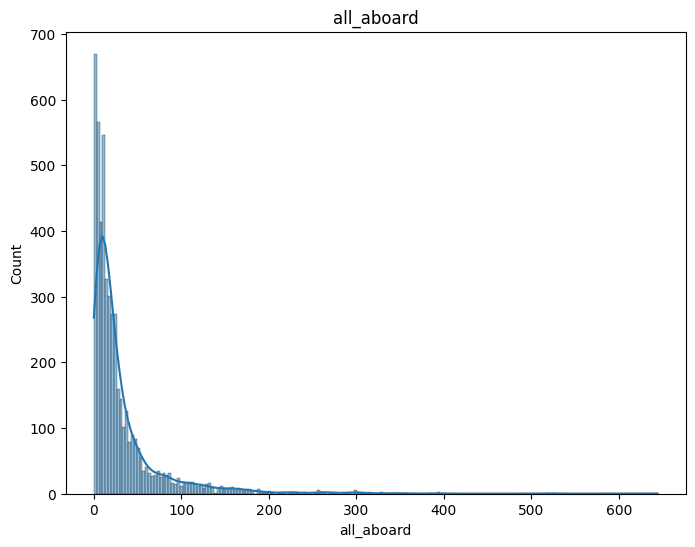

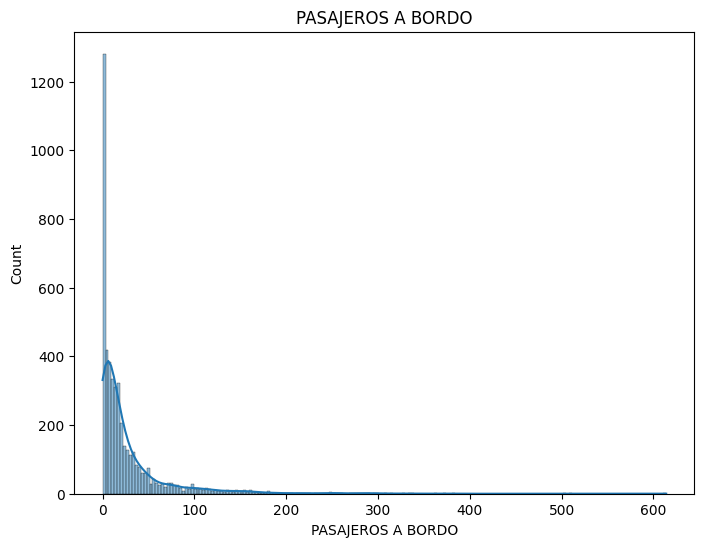

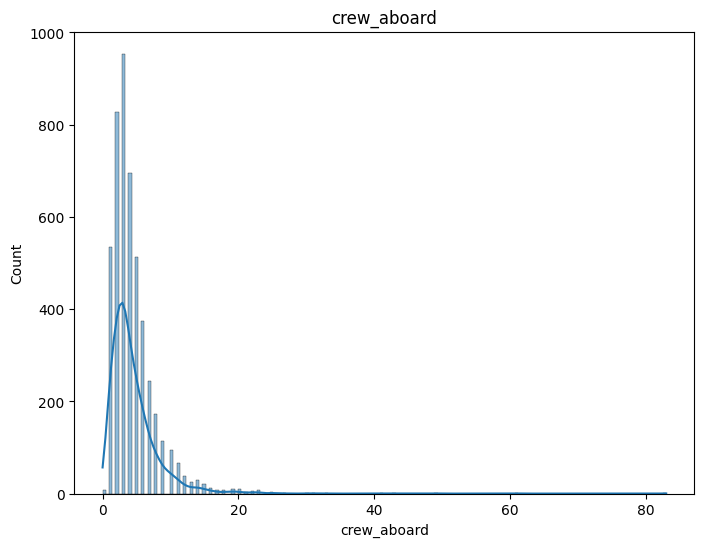

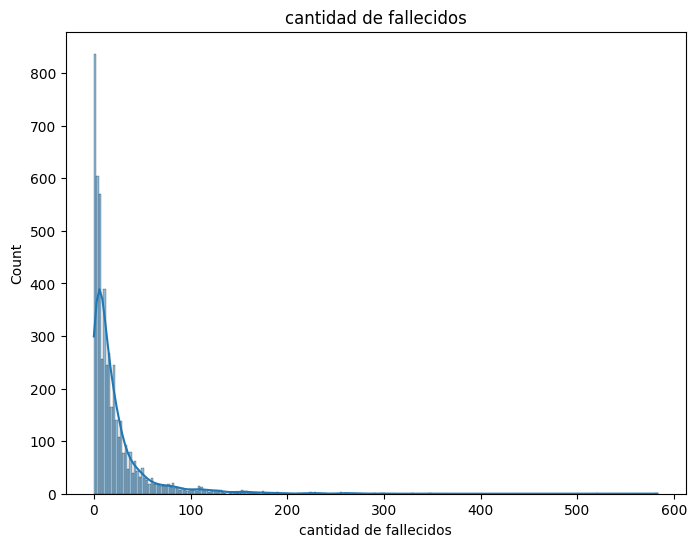

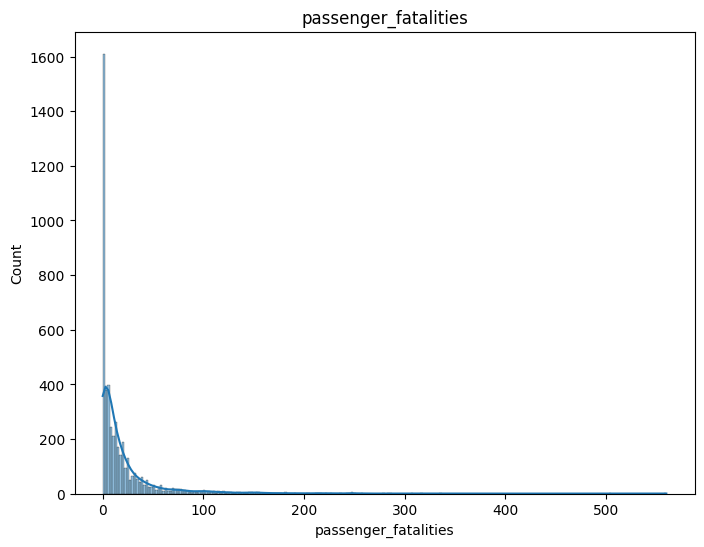

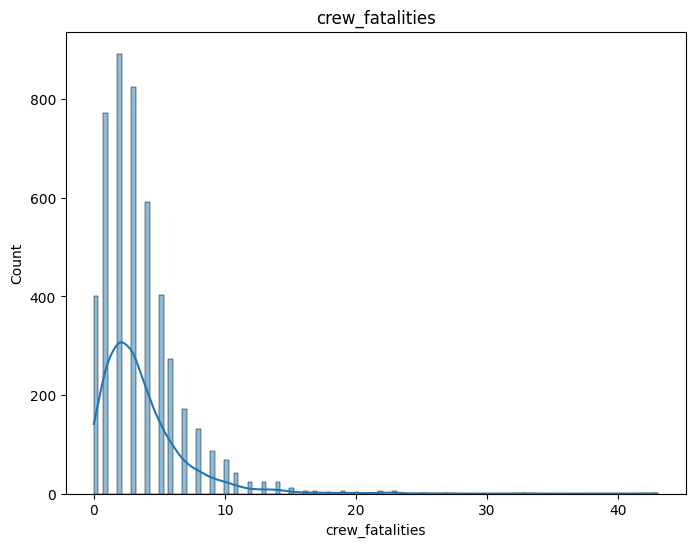

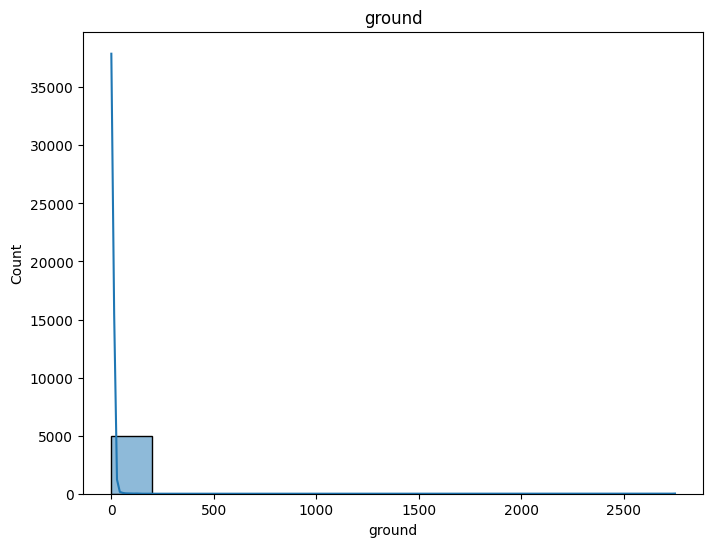

In [12]:
numeric_columns = ["all_aboard", "PASAJEROS A BORDO", "crew_aboard", "cantidad de fallecidos", "passenger_fatalities", "crew_fatalities", "ground"]
for column in numeric_columns:
    df[column] = pd.to_numeric(df[column], errors="coerce")
    plt.figure(figsize=(8, 6))
    sns.histplot(df[column].dropna(), kde=True)
    plt.title(column)
    plt.show()

### Veamos la distribucion de los valores nulos:

Notamos que HORA declarada tiene aprox un 30% de valores nulos y flight_no tiene mas del 70%. Mas adelante podemos rescindir de estas columnas, por tener muchos nulos y por no aportar informacion relevante a nuestro analisis:

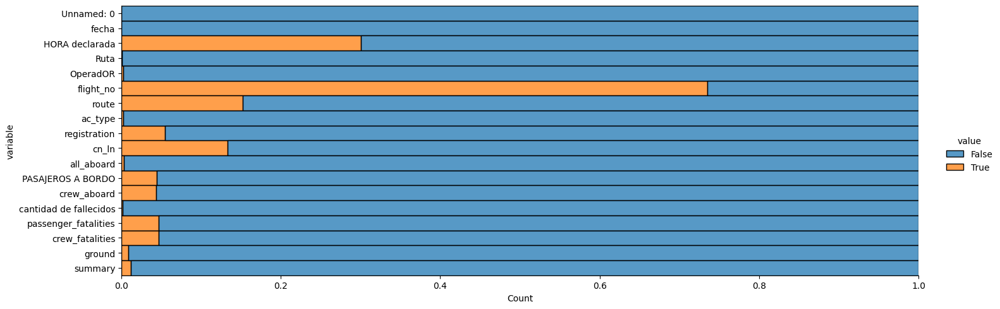

In [13]:
#los valores en True son los valores nulos
(df
.isnull()
.melt()
.pipe(lambda df:(sns.displot(data=df, y ="variable", hue = "value", multiple ="fill", aspect=3)))
)

### Eliminamos columnas que vamos considerando de nulo o de bajo valor para nuestro analisis:

In [14]:
df.drop(columns=['Unnamed: 0', 'HORA declarada', 'flight_no', 'registration', 'cn_ln'], inplace=True)

### Vamos a considerar solo el año de los accidentes para nuestro analisis. Tambien descartamos los años anteriores a la creacion de la aviacion civil, es decir, 1914:

In [15]:
df['fecha'] = pd.to_datetime(df['fecha'])

# Filtramos las filas con fechas mayores a 1914
df= df[df['fecha'].dt.year >= 1914]

# Extraemos el año de la columna 'fecha' y creamos la columna 'year' 
df['year'] = df['fecha'].dt.year

df.head()

,fecha,Ruta,OperadOR,route,ac_type,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary,year
6,1915-03-05,"Tienen, Belgium",Military - German Navy,NaN,Zeppelin L-8 (airship),41.0,0.0,41.0,17.0,0.0,17.0,0.0,Crashed into trees while attempting to land af...,1915
7,1915-09-03,"Off Cuxhaven, Germany",Military - German Navy,NaN,Zeppelin L-10 (airship),19.0,NaN,NaN,19.0,NaN,NaN,0.0,"Exploded and burned near Neuwerk Island, when...",1915
8,1916-07-28,"Near Jambol, Bulgeria",Military - German Army,NaN,Schutte-Lanz S-L-10 (airship),20.0,NaN,NaN,20.0,NaN,NaN,0.0,"Crashed near the Black Sea, cause unknown.",1916
9,1916-09-24,"Billericay, England",Military - German Navy,NaN,Zeppelin L-32 (airship),22.0,NaN,NaN,22.0,NaN,NaN,0.0,Shot down by British aircraft crashing in flames.,1916
10,1916-10-01,"Potters Bar, England",Military - German Navy,NaN,Zeppelin L-31 (airship),19.0,0.0,19.0,19.0,0.0,19.0,0.0,Shot down in flames by the British 39th Home D...,1916


### Creamos un primer informe complementario para tener un panorama mas completo del que tenemos hasta ahora:

In [16]:
# Crear el informe de perfil
profile = ProfileReport(df, title='Reporte', explorative=True, dark_mode=True)

# Generar el informe como un archivo HTML
profile.to_file('Reportes\informe1.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# Veamos el informe:
profile

### Vamos a trabajar con la columna `OperadOR`, nuestro analisis es sobre aviacion civil por lo que vamos a prescindir de informacion de accidentes aereos de operadores militares:

De esta manera estamos reduciendo nuestras observaciones en un 15% aprox.

In [18]:
# Convertir la columna "OperadOR" a tipo de datos de cadena de texto
df['OperadOR'] = df['OperadOR'].astype(str)

In [19]:
# Filtramos las filas que no contengan las palabras "Military", "military", "militar", "MILITAR", "Fuerza", "fuerza" en la columna "OperadOR"
df_filtered = df[~df['OperadOR'].str.lower().str.contains('military|militar|force|fuerza|fuerzs|nan')]
df_filtered

,fecha,Ruta,OperadOR,route,ac_type,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary,year
23,1918-12-16,"Elizabeth, New Jersey",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,1.0,0.0,Carl Smith was killed when his mail plane feet...,1918
24,1919-05-25,"Cleveland, Ohio",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,1.0,0.0,Caught fire in midair. The pilot leaped from t...,1919
25,1919-07-19,"Dix Run, Pennsylvania",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The mail plane crashed under unknown circumsta...,1919
26,1919-07-21,"Chicago, Illinois",Wingfoot Air Express Goodyear Tire,Shuttle,FD Type Dirigible,NaN,NaN,NaN,3.0,2.0,1.0,10.0,"The dirigible, cruising at 1,200 ft. caught fi...",1919
27,1919-08-02,"Verona, Italy",Caproni Company,Venice Taliedo,Caproni Ca.48,14.0,12.0,2.0,14.0,12.0,2.0,0.0,As the plane was passing over Verona the wings...,1919
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4999,2020-08-22,"Juba, South Sudan",South West Aviaiton,Juba - Wau,Antonov 26B,8.0,5.0,3.0,7.0,4.0,3.0,0.0,The cargo plane lost height shortly after depa...,2020
5001,2021-01-09,"Near Jakarta, Indonesia",Sriwijaya Air,Jakarta - Pontianak,Boeing 737-524,62.0,56.0,6.0,62.0,56.0,6.0,0.0,Sriwijaya Air flight 182 was climbing through ...,2021
5002,2021-03-02,"Pieri, Sudan",South Sudan Supreme Airlines,Pieri - Yuai,Let L-410UVP-E,10.0,8.0,2.0,10.0,8.0,2.0,0.0,One of the engines on the aircraft failed 10 m...,2021
5003,2021-03-28,"Near Butte, Alaska",Soloy Helicopters,Sightseeing Charter,Eurocopter AS350B3 Ecureuil,6.0,5.0,1.0,5.0,4.0,1.0,0.0,The sightseeing helicopter crashed after missi...,2021


In [20]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4186 entries, 23 to 5007
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fecha                   4186 non-null   datetime64[ns]
 1   Ruta                    4181 non-null   object        
 2   OperadOR                4186 non-null   object        
 3   route                   3676 non-null   object        
 4   ac_type                 4181 non-null   object        
 5   all_aboard              4171 non-null   float64       
 6   PASAJEROS A BORDO       4090 non-null   float64       
 7   crew_aboard             4090 non-null   float64       
 8   cantidad de fallecidos  4179 non-null   float64       
 9   passenger_fatalities    4088 non-null   float64       
 10  crew_fatalities         4085 non-null   float64       
 11  ground                  4150 non-null   float64       
 12  summary                 4143 non-null   object 

In [21]:
operador_unique = df_filtered['OperadOR'].unique()

for operador in operador_unique:
    print(operador)

US Aerial Mail Service
Wingfoot Air Express Goodyear Tire
Caproni Company
Aircraft Transport and Travel
Aircraft Travel Transport
Compañia Colombiana de Navegación Aérea
By Air
Latecoere Airlines
Handley Page Transport
Aeropostale
Franco-Roumaine
West Australian Airways
Aero Limited
Daimler Airways / Grands Express Aeriens
Cie des Messageries Aeriennes
Compagnie Franco-Roumaine de Navigaation Aerienne
Grands Express Aeriens
de Havilland Air Service
Amee de l'Air
Grands Express Aeriens (Air Union)
Air Union
Campagnie France Roumaine
Daimler Airways
CCCP
KLM Royal Dutch Airlines
SCADTA
Imperial Airways
Zakavia
Lignes Aeriennes Latecoere
CIDNA
Deutche Lufthansa
Compagnie Internationale de Navigation Aérienne
Deutsche Lufthansa
Pacific Air Transport
Fokker
Qantas
Varney Air Lines
Colonial Air Transport
Reynolds Airways
Private
Aero O-Y
National Air Transport
Colonial Western Airlines
Boeing Air Transport
Iberia Airlines
Ford Air Freight Inc.
British Columbia Airways
National Parks Airways


### Vamos a tratar los valores nulos y normalizar las columnas que lo requieran:

In [22]:
df_filtered.isnull().sum()

fecha                       0
Ruta                        5
OperadOR                    0
route                     510
ac_type                     5
all_aboard                 15
PASAJEROS A BORDO          96
crew_aboard                96
cantidad de fallecidos      7
passenger_fatalities       98
crew_fatalities           101
ground                     36
summary                    43
year                        0
dtype: int64

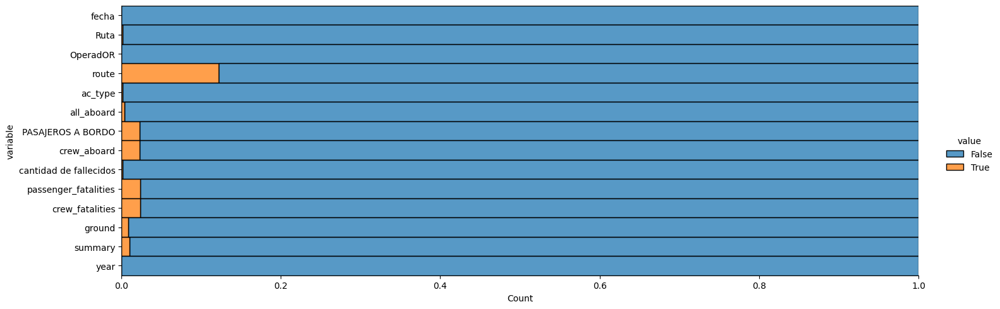

In [23]:
#los valores en True son los valores nulos
(df_filtered
.isnull()
.melt()
.pipe(lambda df:(sns.displot(data=df, y ="variable", hue = "value", multiple ="fill", aspect=3)))
)

#### Vamos a eliminar la columna `route`, si bien contiene la ruta de vuelo (origen y llegada), vamos a considerar que la columna `ruta` es mas especifica porque contiene un lugar aproximado del accidente.

In [24]:
df_filtered.drop(columns=['route'], inplace=True)

#### Tambien eliminaremos las columnas `PASAJEROS A BORDO`, `crew_aboard`, `passenger_fatalities`, `crew_fatalities`, no solo por su alta correlacion (que es evidente) sino que tomaremos el analisis con el total de personas dentro de una aeronave sin importar en calidad de que estan en la misma.

In [25]:
df_filtered.drop(columns=['PASAJEROS A BORDO', 'crew_aboard', 'passenger_fatalities', 'crew_fatalities'], inplace=True)

In [26]:
df_filtered.isnull().sum()

fecha                      0
Ruta                       5
OperadOR                   0
ac_type                    5
all_aboard                15
cantidad de fallecidos     7
ground                    36
summary                   43
year                       0
dtype: int64

In [27]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4186 entries, 23 to 5007
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fecha                   4186 non-null   datetime64[ns]
 1   Ruta                    4181 non-null   object        
 2   OperadOR                4186 non-null   object        
 3   ac_type                 4181 non-null   object        
 4   all_aboard              4171 non-null   float64       
 5   cantidad de fallecidos  4179 non-null   float64       
 6   ground                  4150 non-null   float64       
 7   summary                 4143 non-null   object        
 8   year                    4186 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 327.0+ KB


In [28]:
# Normalizamos los nombre de columnas:
df_filtered.rename(columns={'fecha': 'date', 'OperadOR': 'operator', 'Ruta': 'route', 'cantidad de fallecidos':'total_fatalities'}, inplace=True)
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4186 entries, 23 to 5007
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              4186 non-null   datetime64[ns]
 1   route             4181 non-null   object        
 2   operator          4186 non-null   object        
 3   ac_type           4181 non-null   object        
 4   all_aboard        4171 non-null   float64       
 5   total_fatalities  4179 non-null   float64       
 6   ground            4150 non-null   float64       
 7   summary           4143 non-null   object        
 8   year              4186 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 327.0+ KB


In [29]:
# Elimnamos los valores nulos:
df_clean = df_filtered.dropna()
df_clean.head()

,date,route,operator,ac_type,all_aboard,total_fatalities,ground,summary,year
23,1918-12-16,"Elizabeth, New Jersey",US Aerial Mail Service,De Havilland DH-4,1.0,1.0,0.0,Carl Smith was killed when his mail plane feet...,1918
24,1919-05-25,"Cleveland, Ohio",US Aerial Mail Service,De Havilland DH-4,1.0,1.0,0.0,Caught fire in midair. The pilot leaped from t...,1919
25,1919-07-19,"Dix Run, Pennsylvania",US Aerial Mail Service,De Havilland DH-4,1.0,1.0,0.0,The mail plane crashed under unknown circumsta...,1919
27,1919-08-02,"Verona, Italy",Caproni Company,Caproni Ca.48,14.0,14.0,0.0,As the plane was passing over Verona the wings...,1919
29,1919-10-14,"Cantonsville, Maryland",US Aerial Mail Service,Curtiss R-4LM,1.0,1.0,0.0,The pilot was performing a mail flight to Balt...,1919


#### Transformamos a entero las columnas necesarias para seguir con el analisis:

In [30]:
df_clean['all_aboard'] = df_clean['all_aboard'].astype(int)
df_clean['total_fatalities'] = df_clean['total_fatalities'].astype(int)
df_clean['ground'] = df_clean['ground'].astype(int)

In [31]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4101 entries, 23 to 5007
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              4101 non-null   datetime64[ns]
 1   route             4101 non-null   object        
 2   operator          4101 non-null   object        
 3   ac_type           4101 non-null   object        
 4   all_aboard        4101 non-null   int32         
 5   total_fatalities  4101 non-null   int32         
 6   ground            4101 non-null   int32         
 7   summary           4101 non-null   object        
 8   year              4101 non-null   int64         
dtypes: datetime64[ns](1), int32(3), int64(1), object(4)
memory usage: 272.3+ KB


### Seguimos con nuestro analisis para detectar tendencias, patrones, anomalias, valores atipicos:

In [32]:
#Generamos un resumen estadistico
df_clean.describe()

,all_aboard,total_fatalities,ground,year
count,4101.000000,4101.000000,4101.000000,4101.000000
mean,31.963180,21.778347,1.817849,1971.030237
std,48.425566,36.824321,60.977515,24.569683
min,0.000000,0.000000,0.000000,1918.000000
25%,6.000000,3.000000,0.000000,1951.000000
50%,15.000000,9.000000,0.000000,1971.000000
75%,35.000000,23.000000,0.000000,1992.000000
max,644.000000,583.000000,2750.000000,2021.000000


De este analisi se pueden obtener las siguientes conclusiones:

1. `all_aboard`: La cantidad promedio de personas a bordo de los vuelos es de aprox 32, con un mínimo de 0 y un máximo de 644. El 50% de los vuelos tienen 15 o menos personas a bordo, mientras que el 25% tiene 6 o menos y el 75% tiene 35 o menos. Notamos que el maximo pudiera tratarse de un posible valor atipico que analizaremos posteriormente.

2. `total_fatalities`: La cantidad promedio de fatalidades totales en los accidentes es de alrededor de 22, con un mínimo de 0 y un máximo de 583. El 50% de los accidentes tienen 9 o menos fatalidades, mientras que el 25% tiene 3 o menos y el 75% tiene 23 o menos. Igual aca el maximo de 583 fatalidades es un posible valor atipico y quiza este relacionado con el valor maximo de `all_aboard`.

3. `ground`: La cantidad promedio de fatalidades en tierra es de aproximadamente 2, con un mínimo de 0 y un máximo de 2750. La mayoría de los accidentes no tienen fatalidades en tierra, ya que el 75% de los valores son 0. Teniendo en cuenta el tercer cuartil, el valor de 2750 puede ser un valor atipico.

4. `year`: El análisis se basa en datos recopilados desde el año 1918 hasta el año 2021. La mediana (50%) se encuentra en el año 1971, lo que indica que la mitad de los accidentes aereos ocurrieron antes de ese año y la otra mitad después. Notamos que desde 1914 (creacion de la aviacion civil) hasta 1971 pasaron mas de 50 años y de 1971 a 2021 otros 50. Podemos decir que si bien la cantidad de accidentes no disminuyo en numero su ocurrencia es menor teniendo en cuenta el crecimiento de la industria aerea a lo largo de las años.


### Outliers:

De este analisis obtenemos que aproximadamente el 10% de los registros de `total_fatalities` son outliers. De igual forma obtenemos que el 10% de los datos de `total_aboard` tambien los son. Se puede inferir que el aumento de las personas a bordo es resultado de el ingreso de nueva aeronaves con mayor capacidad, tambien es inferible que el total de fatalidades en casos sea mucho mayor de la media por esta razon. Veremos en detalle los valores maximos mas adelante.

In [33]:
# Calcular el rango intercuartil
Q1 = df_clean['total_fatalities'].quantile(0.25)
Q3 = df_clean['total_fatalities'].quantile(0.75)
IQR = Q3 - Q1

# Definir los límites para detectar valores atípicos
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar los valores atípicos
outliers = df_clean[(df_clean['total_fatalities'] < lower_limit) | (df_clean['total_fatalities'] > upper_limit)]

# Imprimir los valores atípicos
outliers

,date,route,operator,ac_type,all_aboard,total_fatalities,ground,summary,year
1165,1950-03-12,"Llandow Airport, Cardiff, Wales",Fairflight Ltd.,Avro 689 Tudor 5,83,80,0,During the approach to Runway 28 at Llandow Ai...,1950
1183,1950-06-23,"Lake Michigan, 18 NNW of Benton Harbor, Michigan",Northwest Orient Airlines,Douglas DC-4,58,58,0,"En route from New York to Minneapolis, the air...",1950
1198,1950-08-31,"Near Wadi Natrun, Egypt",Trans World Airlines,Lockheed 749A Constellation,55,55,0,After taking off from Cario and while climbing...,1950
1211,1950-11-13,"Mt. Tete de L'Obiou, France",Curtiss-Reid Flying Services Ltd. (Canada),Douglas C-54B-1-DC,58,58,0,The aircraft drifted 50 miles off the prescrib...,1950
1294,1951-12-16,"Elizabeth, New Jersey",Miami Airlines,Curtiss Wright C-46F,56,56,1,Shortly after taking off from Newark Airport t...,1951
...,...,...,...,...,...,...,...,...,...
4978,2018-10-29,"Off Jakarta, Indonesia",Lion Air,Boeing 737-MAX 8,189,189,0,"The airliner crashed into the Jakarta Sea, 13 ...",2018
4983,2019-03-10,"Bishoftu, Ethiopia",Ethiopian Airlines,Boeing 737 Max 8,157,157,0,The internationally scheduled airliner crashed...,2019
4994,2020-01-08,"Near Shahriah, Iran",Ukraine International Airlines,Boeing 737-8KV WL,176,176,0,The plane took off from Tehran International A...,2020
4997,2020-05-22,"Karachi, Pakistan",Pakistan International Airline,Airbus A320-214,99,97,1,"While landing, the aircraft scraped the runway...",2020


In [34]:
# Calcular el rango intercuartil
Q1 = df_clean['all_aboard'].quantile(0.25)
Q3 = df_clean['all_aboard'].quantile(0.75)
IQR = Q3 - Q1

# Definir los límites para detectar valores atípicos
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar los valores atípicos
outliers = df_clean[(df_clean['all_aboard'] < lower_limit) | (df_clean['all_aboard'] > upper_limit)]

# Imprimir los valores atípicos
outliers

,date,route,operator,ac_type,all_aboard,total_fatalities,ground,summary,year
462,1937-05-06,"Lakehurst, New Jersey",Deutsche Zeppelin Reederei,Zeppelin LZ-129,97,35,1,The airship Hindenburg caught fire and burned ...,1937
1116,1949-06-07,"San Juan, Puerto Rico",Strato Freight,Curtiss C-46D-5-CU,81,53,0,The aircraft crashed into the Atlantic Ocean d...,1949
1165,1950-03-12,"Llandow Airport, Cardiff, Wales",Fairflight Ltd.,Avro 689 Tudor 5,83,80,0,During the approach to Runway 28 at Llandow Ai...,1950
1580,1956-06-30,"Grand Canyon, Arizona",United Air Lines / Trans World Airlines,Douglas DC-7 / Lockheed S Constellation,128,128,0,The TWA aircraft flying from Los Angeles to Ka...,1956
1594,1956-11-05,"Blackbushe, England",Britavia,Handley Page HP-1 Hermes,80,7,0,While attempting to land the aircraft descende...,1956
...,...,...,...,...,...,...,...,...,...
4992,2019-12-27,"Almaty, Kazakhstan",Bek Air,Fokker 100,98,12,0,"While taking off, the tail of the plane struck...",2019
4994,2020-01-08,"Near Shahriah, Iran",Ukraine International Airlines,Boeing 737-8KV WL,176,176,0,The plane took off from Tehran International A...,2020
4995,2020-02-05,"Istanbul, Turkey",Pegasus Airlines,Boeing 737-86J,177,3,0,While landing duriing high winds and heavey ra...,2020
4997,2020-05-22,"Karachi, Pakistan",Pakistan International Airline,Airbus A320-214,99,97,1,"While landing, the aircraft scraped the runway...",2020


#### Analicemos la columna `ground`:

In [35]:
count_zeros = (df_clean['ground'] == 0).sum()
print("Cantidad de ceros en la columna 'ground':", count_zeros)

Cantidad de ceros en la columna 'ground': 3921


Se puede concluir que solo el 5% de las veces que ocurre un acidente aereo, hay fatalidades no relacionadas con las personas a bordo.

In [36]:
#Porcentaje de ceros
3921*100/4101

95.61082662765179

Analicemos los valores distintos de cero:

In [37]:
ground_nonzero = df_clean[df_clean['ground'] != 0]['ground'].value_counts()
print(ground_nonzero)

1       51
2       28
3       18
4       14
5        9
7        9
8        7
10       4
24       3
12       2
30       2
2750     2
11       2
22       2
6        2
13       2
125      2
44       2
45       1
47       1
78       1
14       1
25       1
225      1
39       1
113      1
18       1
15       1
49       1
9        1
32       1
19       1
71       1
29       1
20       1
53       1
35       1
Name: ground, dtype: int64


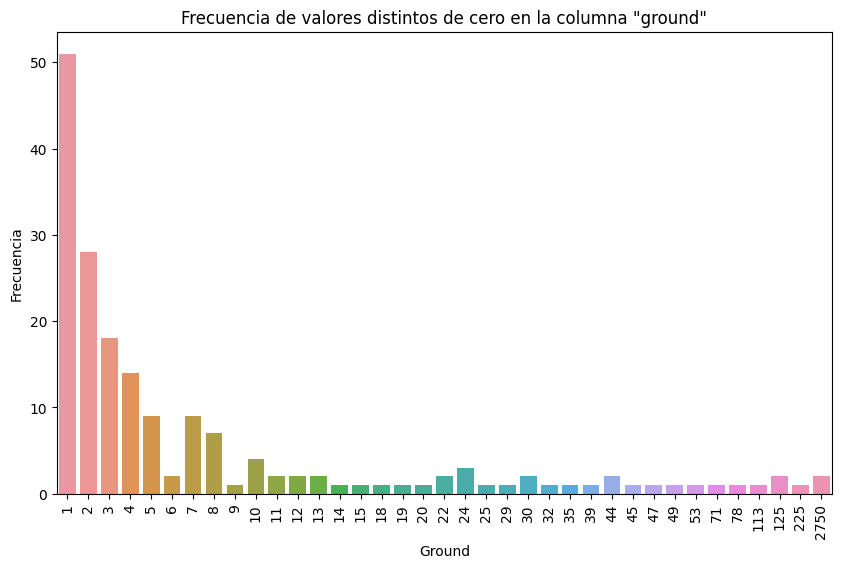

In [38]:
plt.figure(figsize=(10, 6))
sns.barplot(x=ground_nonzero.index, y=ground_nonzero.values)
plt.xlabel('Ground')
plt.ylabel('Frecuencia')
plt.title('Frecuencia de valores distintos de cero en la columna "ground"')
plt.xticks(rotation=90)
plt.show()

Veamos a que eventos corresponden algunos de esos valores atipicos:

Aca podemos ver que el valor 2750 en `ground` corresponden al mismo atentado terrorista del 11 de Septiembre de 2001 El valor 125 del anio 2001 tambien pertenece al mismo atentado. Aca un enlace --> [Atentado 9/11](https://es.wikipedia.org/wiki/Atentados_del_11_de_septiembre_de_2001) <--. El valor 225 de African Air corresponde a un accidente donde el avion después de haber fallado al despegar, chocó contra el mercado callejero provocando la muerte de mas de 225 personas. Aca un enlace --> [Accidente Air Africa 1996](https://es.wikipedia.org/wiki/Accidente_de_avi%C3%B3n_de_Air_Africa_1996)<--. Podemos concluir, teniendo en cuenta los datos, que solo en una minoria de los accidentes aereos se ven involucradas en la estadistica fatal personas que no estan abordo de la aeronave.

In [39]:
ground_nonzero_rows = df_clean[df_clean['ground'] != 0]
ground_nonzero_rows = ground_nonzero_rows.sort_values(by='ground', ascending=False)
ground_nonzero_rows = ground_nonzero_rows.drop(['route', 'ac_type'], axis=1)
ground_nonzero_rows.head(20)

,date,operator,all_aboard,total_fatalities,ground,summary,year
4346,2001-09-11,American Airlines,92,92,2750,The aircraft was hijacked shortly after it lef...,2001
4347,2001-09-11,United Air Lines,65,65,2750,The aircraft was hijacked shortly after it lef...,2001
4004,1996-01-08,African Air,6,2,225,The aircraft failed to gain altitude after tak...,1996
2259,1966-12-24,Flying Tiger Line,4,4,125,The cargo plane undershot runway by 1 mile whi...,1966
4345,2001-09-11,American Airlines,64,64,125,The aircraft was hijacked after taking off fro...,2001
2877,1976-10-13,Lloyd Aéreo Boliviano,3,3,113,The cargo plane failed to climb and crashed in...,1976
4388,2002-05-04,EAS Airlines (Executive Airline Services),77,74,78,"The aircraft crashed into houses, two mosques ...",2002
2395,1969-03-16,Venezolana Internacional de Aviacion,84,84,71,"Seconds after becoming airborne, the aircraft ...",1969
527,1938-08-24,Japan Air / Japan Flying School,5,5,53,Midair collision between the airliner and a sm...,1938
3296,1984-09-18,AECA Cargo,4,4,49,"While taking off, the cargo plane was unable t...",1984


#### Analicemos la columna `total_fatalities`

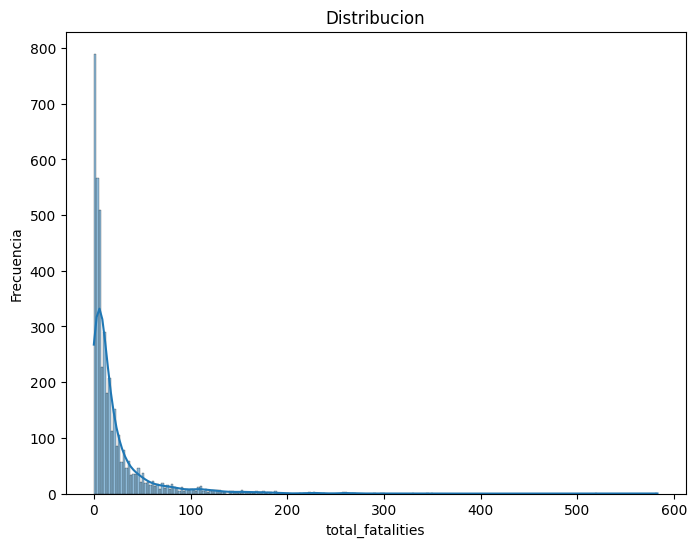

In [40]:
plt.figure(figsize=(8, 6))
sns.histplot(df_clean['total_fatalities'], kde=True)
plt.xlabel('total_fatalities')
plt.ylabel('Frecuencia')
plt.title('Distribucion')
plt.show()

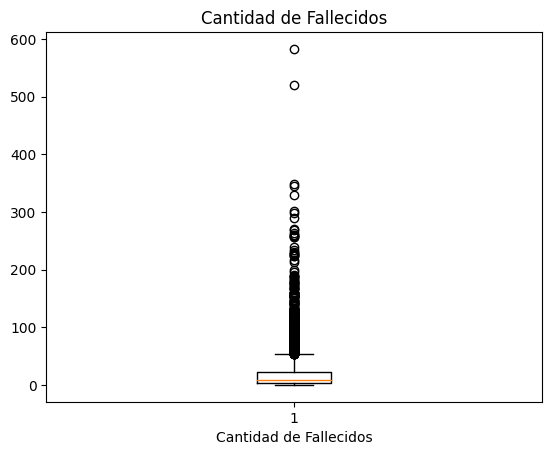

In [41]:
# Crear el gráfico de diagrama de caja
plt.boxplot(df_clean['total_fatalities'])

# Agregar título y etiquetas de los ejes
plt.title('Cantidad de Fallecidos')
plt.xlabel('Cantidad de Fallecidos')

# Mostrar el gráfico
plt.show()

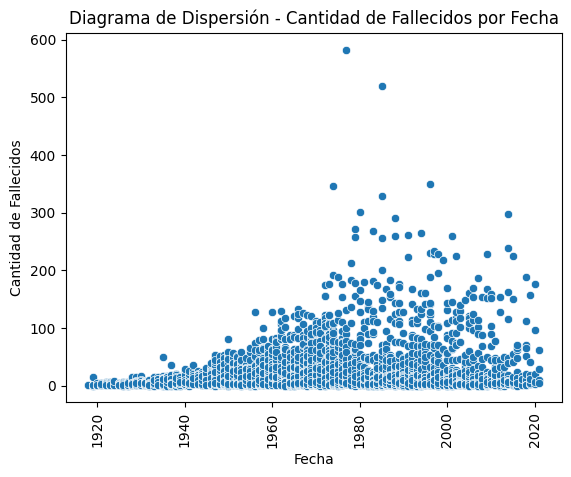

In [42]:
sns.scatterplot(x='year', y='total_fatalities', data=df_clean)

plt.xticks(rotation=90)

plt.title('Diagrama de Dispersión - Cantidad de Fallecidos por Fecha')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Fallecidos')

plt.show()

In [43]:
total_fatalities_counts = df_clean['total_fatalities'].value_counts().sort_index()
total_fatalities_counts

0       67
1      366
2      357
3      342
4      225
      ... 
329      1
346      1
349      1
520      1
583      1
Name: total_fatalities, Length: 196, dtype: int64

Analicemos los valores atipicos:

In [44]:
columna = df_clean['total_fatalities']

# Calcular los límites para definir los valores atípicos
q1 = columna.quantile(0.25)
q3 = columna.quantile(0.75)
iqr = q3 - q1
umbral_inferior = q1 - 1.5 * iqr
umbral_superior = q3 + 1.5 * iqr

# Identificar los valores atípicos
valores_atipicos = columna[(columna < umbral_inferior) | (columna > umbral_superior)]

# Contar los valores atípicos
cantidad_atipicos = len(valores_atipicos)

print(f"Cantidad de valores atípicos: {cantidad_atipicos} y representa un {round(cantidad_atipicos*100/columna.count())}% del total de los datos. Esto teniendo en cuenta que el umbral superior es {umbral_superior}." )

Cantidad de valores atípicos: 414 y representa un 10% del total de los datos. Esto teniendo en cuenta que el umbral superior es 53.0.


Veamos algunos valores atipicos y a que eventos corresponden.

En primer lugar con 583 fatalidades tenemos el famoso caso de las Islas Canarias en 1977 donde dos aviones colisionaron en la pista causando la muerte de 583 personas. Te dejo un enlace por aca --> [Accidente de los Rodeos](https://es.wikipedia.org/wiki/Desastre_a%C3%A9reo_de_Tenerife) <--. En segundo lugar un accidente de Japan Air Lines de 1985 que dejo 520 muertes, permanece como el desastre aéreo más grave en la historia de la aviación con una sola aeronave implicada. Enlace aca --> [Accidente Japan Air Lines](https://es.wikipedia.org/wiki/Vuelo_123_de_Japan_Airlines) <--

In [45]:
df_clean.sort_values('total_fatalities', ascending=False).head(30)

,date,route,operator,ac_type,all_aboard,total_fatalities,ground,summary,year
2902,1977-03-27,"Tenerife, Canary Islands",Pan American World Airways / KLM,Boeing B-747-121 / Boeing B-747-206B,644,583,0,Both aircraft were diverted to Tenerife becaus...,1977
3341,1985-08-12,"Mt. Osutaka, near Ueno Village, Japan",Japan Air Lines,Boeing B-747-SR46,524,520,0,The aircraft suffered an aft pressure bulkhead...,1985
4057,1996-11-12,"Near Charkhi Dadri, India",Saudi Arabian Airlines / Kazakhstan Airlines,Boeing B-747-168B / Ilyushin IL-76TD,349,349,0,Midair collision 17 km W of New Delhi. The Sa...,1996
2737,1974-03-03,"Near Ermenonville, France",Turkish Airlines (THY),McDonnell Douglas DC-10-10,346,346,0,The aircraft crashed shortly after takeoff fro...,1974
3337,1985-06-23,"Atlantic Ocean, 110 miles West of Ireland",Air India,Boeing B-747-237B,329,329,0,The aircraft broke up in flight and crashed in...,1985
3093,1980-08-19,"Riyadh, Saudi Arabia",Saudi Arabian Airlines,Lockheed 1011-200 TriStar,301,301,0,The flight experienced a fire in the aft cargo...,1980
4895,2014-07-17,"Hrabove, Ukraine",Malaysia Airlines,Boeing 777-2H6ER,298,298,0,A Boeing 777-200 airliner operating as Malays...,2014
3500,1988-07-03,"Over the Persian Gulf, near Bandar Abbas, Iran",Iran Air,Airbus A300B2-203,290,290,0,The civilian Iranian airliner was shot down by...,1988
3024,1979-05-25,"Chicago O'Hare, Illinois",American Airlines,McDonnell Douglas DC-10-10,271,271,2,"During takeoff just, as the plane lifted from ...",1979
3244,1983-09-01,"Near Sakhalin Island, Russia",Korean Airlines,Boeing B-747-230B,269,269,0,"On a flight from Alaska to South Korea, the ai...",1983


#### Analicemos la columna `all_aboard`

Hay dos registros donde `all_aboard` es igual a cero. Eliminaremos estos registros.

In [46]:
count_zeros = (df_clean['all_aboard'] == 0).sum()
print("Cantidad de ceros en la columna 'ground':", count_zeros)

Cantidad de ceros en la columna 'ground': 2


In [47]:
filas_ceros = df_clean[df_clean['all_aboard'] == 0]
filas_ceros

,date,route,operator,ac_type,all_aboard,total_fatalities,ground,summary,year
30,1919-10-20,"English Channel off Forkstone, Kent",Aircraft Transport and Travel,De Havilland DH-4,0,0,0,Crashed into the sea while attempting to land ...,1919
120,1927-01-12,"Estaires, France",Fokker,Fokker F-VII,0,0,0,The flight crew encountered poor weather condi...,1927


In [48]:
df_clean = df_clean[df_clean['all_aboard'] != 0]

In [49]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4099 entries, 23 to 5007
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              4099 non-null   datetime64[ns]
 1   route             4099 non-null   object        
 2   operator          4099 non-null   object        
 3   ac_type           4099 non-null   object        
 4   all_aboard        4099 non-null   int32         
 5   total_fatalities  4099 non-null   int32         
 6   ground            4099 non-null   int32         
 7   summary           4099 non-null   object        
 8   year              4099 non-null   int64         
dtypes: datetime64[ns](1), int32(3), int64(1), object(4)
memory usage: 272.2+ KB


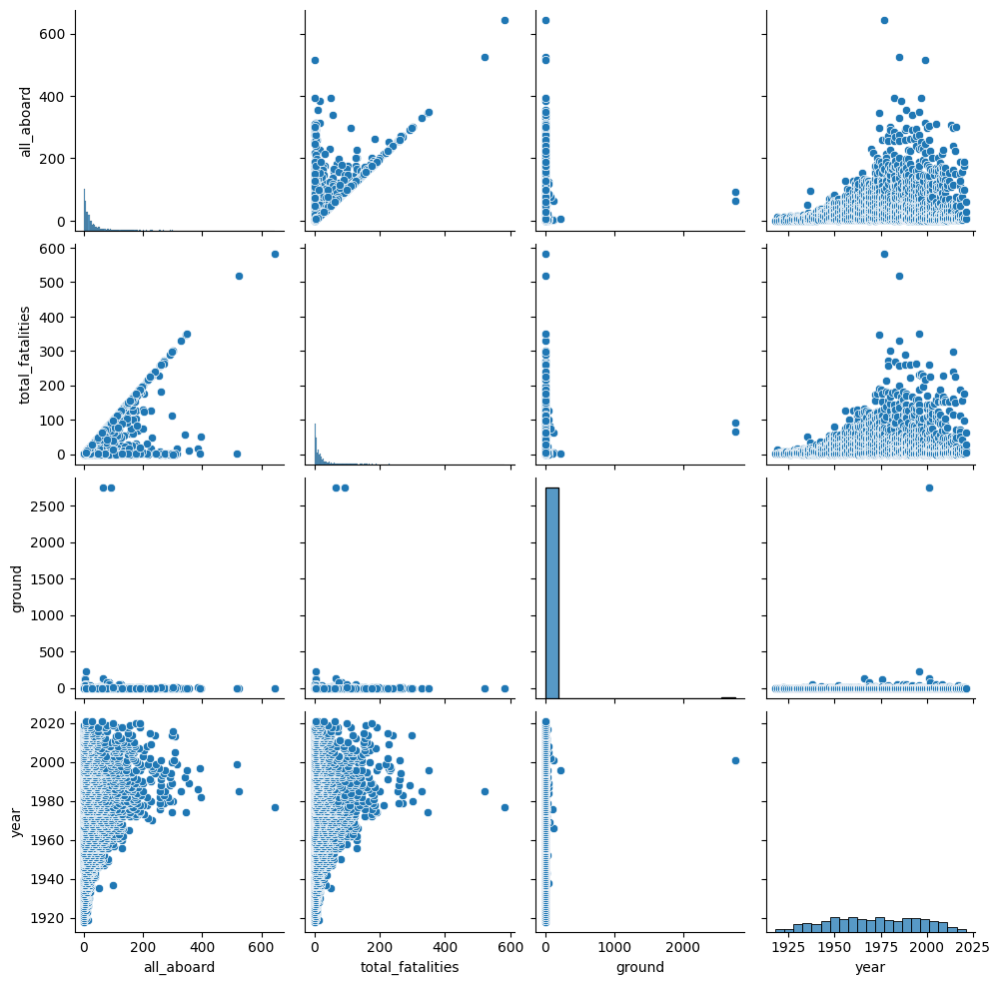

In [50]:
# Gráfico de dispersión entre variables numéricas

numeric_cols = df_clean.select_dtypes(include=['int32', 'int64']).columns
sns.pairplot(df_clean[numeric_cols])
plt.show()

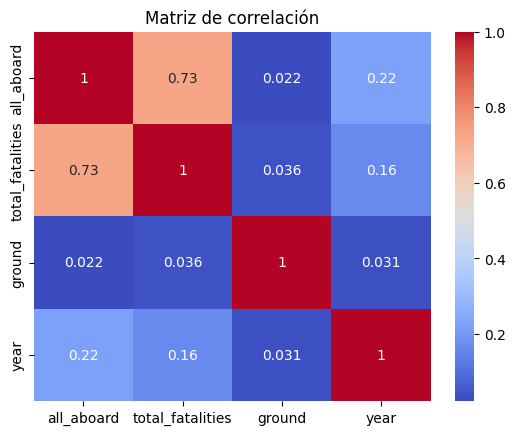

In [51]:
# Correlación entre variables numéricas
corr_matrix = df_clean[numeric_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Matriz de correlación")
plt.show()

### Analisis entre las columnas `all_aboard` y `total_fatalities`

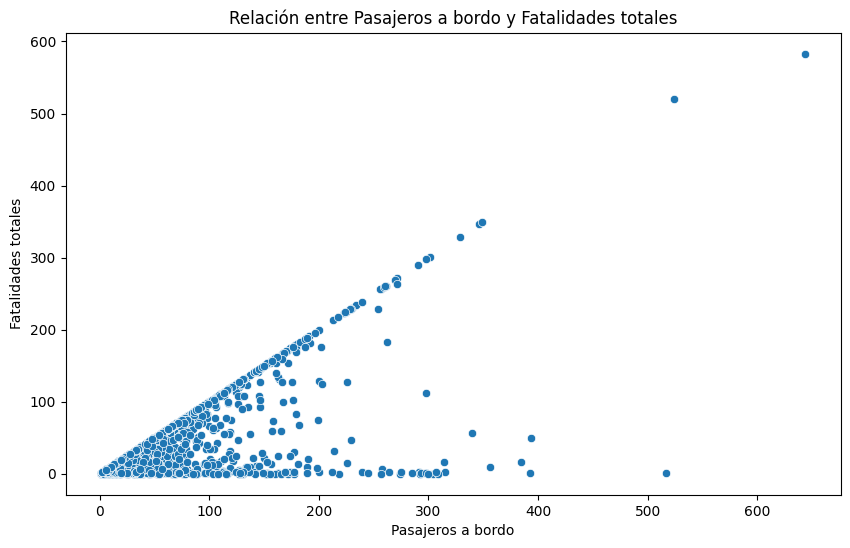

In [52]:
# Gráfico de dispersión entre las columnas "all_aboard" y "total_fatalities"
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_clean, x="all_aboard", y="total_fatalities")
plt.title("Relación entre Pasajeros a bordo y Fatalidades totales")
plt.xlabel("Pasajeros a bordo")
plt.ylabel("Fatalidades totales")
plt.show()

Veamos cuantos valores de `total_fatalities` estan por encima del 50%, 60%, 70%, 80%, 90% de los valores de `all_aboard` y cuando `total_fatalities` es igual `all_aboard`

In [53]:
percentiles = df_clean['all_aboard'].quantile([0.5, 0.6, 0.7, 0.8, 0.9])

In [54]:
count_50 = df_clean[df_clean['total_fatalities'] > percentiles[0.5]]['total_fatalities'].count()
count_60 = df_clean[df_clean['total_fatalities'] > percentiles[0.6]]['total_fatalities'].count()
count_70 = df_clean[df_clean['total_fatalities'] > percentiles[0.7]]['total_fatalities'].count()
count_80 = df_clean[df_clean['total_fatalities'] > percentiles[0.8]]['total_fatalities'].count()
count_90 = df_clean[df_clean['total_fatalities'] > percentiles[0.9]]['total_fatalities'].count()
count_equal = df_clean[df_clean['total_fatalities'] == df_clean['all_aboard']]['total_fatalities'].count()

In [55]:
print(f"Valores de total_fatalities por encima del 50% de all_aboard: {count_50}")
print(f"Valores de total_fatalities por encima del 60% de all_aboard: {count_60}")
print(f"Valores de total_fatalities por encima del 70% de all_aboard: {count_70}")
print(f"Valores de total_fatalities por encima del 80% de all_aboard: {count_80}")
print(f"Valores de total_fatalities por encima del 90% de all_aboard: {count_90}")
print(f"Valores de total_fatalities iguales a all_aboard: {count_equal}")

Valores de total_fatalities por encima del 50% de all_aboard: 1460
Valores de total_fatalities por encima del 60% de all_aboard: 1162
Valores de total_fatalities por encima del 70% de all_aboard: 816
Valores de total_fatalities por encima del 80% de all_aboard: 507
Valores de total_fatalities por encima del 90% de all_aboard: 229
Valores de total_fatalities iguales a all_aboard: 2514


#### Veamos la distribucion de fatalidades totales

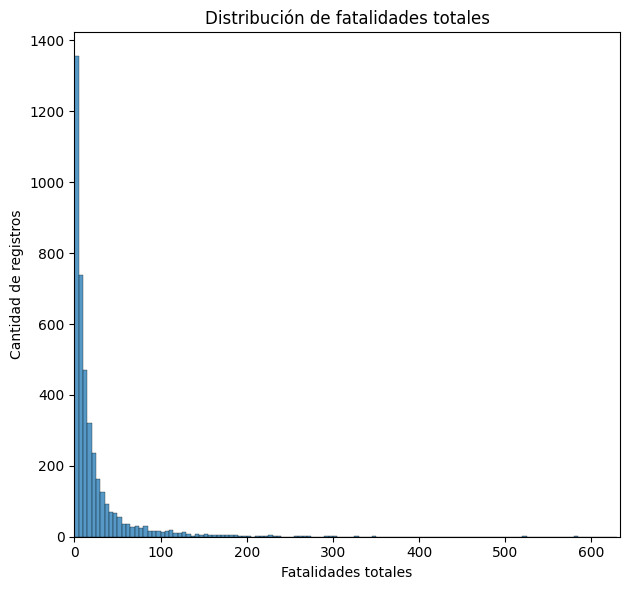

In [56]:
# Configurar el tamaño de la figura
plt.figure(figsize=(12, 6))

# Gráfico de barras
plt.subplot(1, 2, 1)
sns.histplot(data=df_clean, x="total_fatalities", bins=range(0, int(df_clean["total_fatalities"].max()) + 50, 5))
plt.title("Distribución de fatalidades totales")
plt.xlabel("Fatalidades totales")
plt.ylabel("Cantidad de registros")

# Ajustar la escala del eje x del gráfico de distribución
plt.xlim(0, int(df_clean["total_fatalities"].max()) + 50)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar el plot
plt.show()

### Analicemos `total_fatalities` en el tiempo

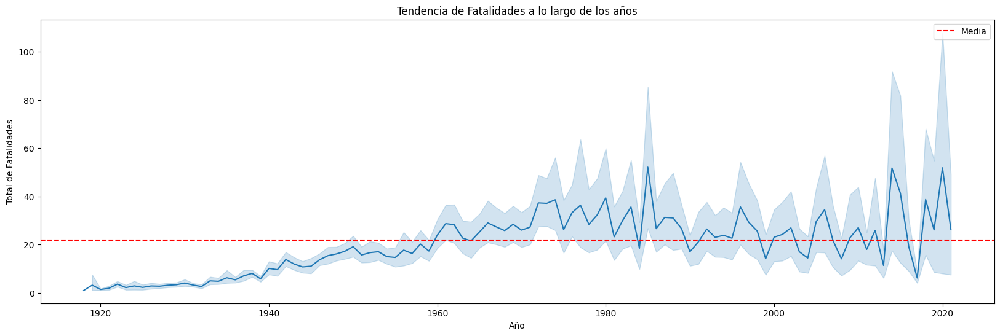

In [57]:
plt.figure(figsize=(20, 6))
sns.lineplot(x='year', y='total_fatalities', data=df_clean)
plt.axhline(df_clean['total_fatalities'].mean(), color='red', linestyle='--', label='Media')
plt.xlabel('Año')
plt.ylabel('Total de Fatalidades')
plt.title('Tendencia de Fatalidades a lo largo de los años')
plt.legend()
plt.show()

##### Notamos una tendencia que se fue elevando hasta aprox 1980. Se mantiene dentro de la media calculada de 22 muertes anuales.

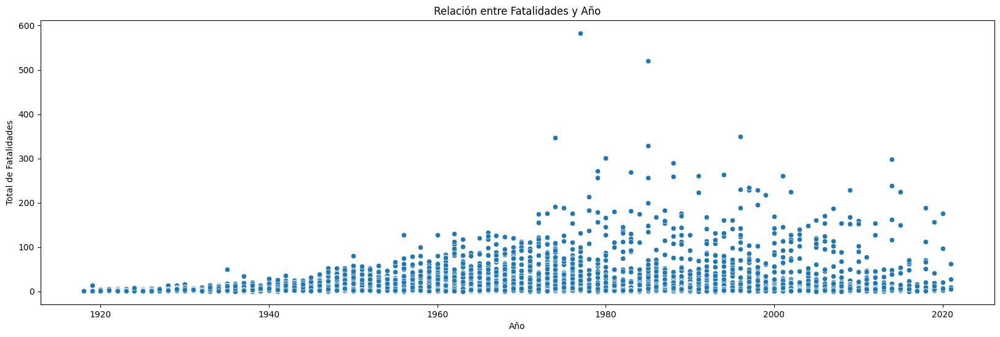

In [58]:
plt.figure(figsize=(20, 6))
sns.scatterplot(x='year', y='total_fatalities', data=df_clean)
plt.xlabel('Año')
plt.ylabel('Total de Fatalidades')
plt.title('Relación entre Fatalidades y Año')
plt.show()

### Sigamos nuestro analisis con la columna `route`. Tratemos de encontrar algun patron y/o dar soporte a las conclusiones que hemos ido dando a lo largo de este analisis.

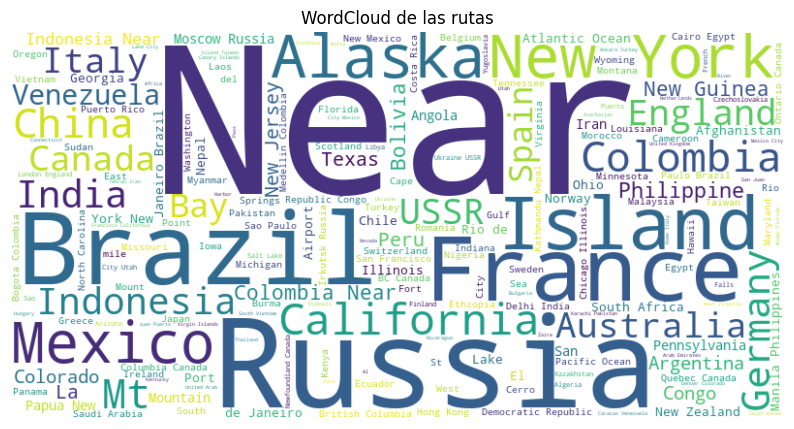

In [59]:
# Concatenar todas las palabras de la columna "route"
all_routes = ' '.join(df_clean['route'])

# Crear un objeto WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_routes)

# Mostrar el WordCloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud de las rutas')
plt.axis('off')
plt.show()

Limpiemos un poco los datos, vamos a deshacernos de palabras que consideramos sin valor

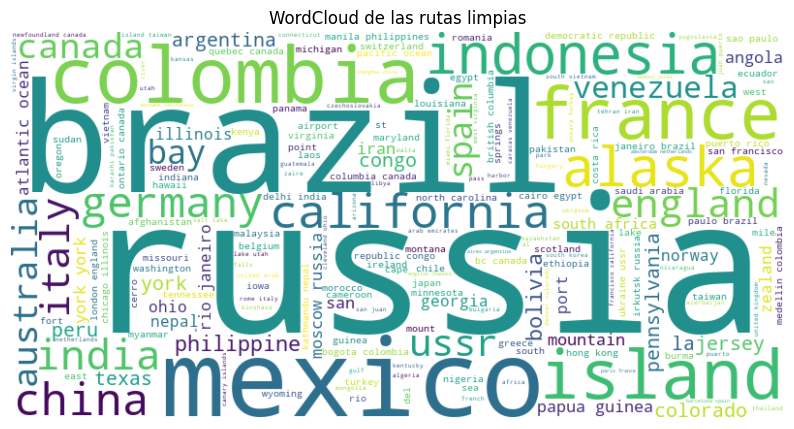

In [60]:
# Lista de palabras no deseadas
unwanted_words = ['a', 'an', 'the', 'in', 'on', 'at', 'to', 'from', 'for', 'near', 'out', 'off', 'new', 'city', 'mt', 'of', 'de', 'el', 'new']

# Función para limpiar las palabras no deseadas
def clean_route(route):
    route_words = re.findall(r'\w+', route.lower())
    cleaned_words = [word for word in route_words if word not in unwanted_words]
    cleaned_route = ' '.join(cleaned_words)
    return cleaned_route

# Aplicar la limpieza a la columna "route"
df_clean['cleaned_route'] = df_clean['route'].apply(clean_route)

# Concatenar todas las palabras limpias
cleaned_routes = ' '.join(df_clean['cleaned_route'])

# Crear un objeto WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_routes)

# Mostrar el WordCloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('WordCloud de las rutas limpias')
plt.axis('off')
plt.show()

#### Vemos, que como inferimos al principio, Rusia posee un alto indice de accidentes aereos historicamente, tengamos en cuenta que hay muchos nombre de ciudades por lo que no es definitivo este resultado, ya que, por ejemplo puede haber muchos accidentes en varias ciudades de un pais especifico y con este analisis no lo podemos concluir.

In [61]:
# Obtener un conteo de las palabras en la columna "route"
word_count = df_clean['cleaned_route'].str.split().explode().value_counts()

# Mostrar la lista completa sin truncar
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(word_count)

russia              229
brazil              160
colombia            139
canada              120
mexico              106
france              104
california           97
alaska               93
indonesia            89
india                80
york                 80
island               77
china                74
germany              72
italy                70
england              70
ussr                 62
san                  60
spain                57
philippines          56
south                53
australia            51
venezuela            49
congo                47
bolivia              44
ohio                 41
bay                  41
ocean                39
guinea               39
peru                 39
texas                38
jersey               36
argentina            36
colorado             36
lake                 35
north                34
rio                  34
islands              34
la                   33
republic             33
illinois             33
iran            

In [62]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4099 entries, 23 to 5007
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              4099 non-null   datetime64[ns]
 1   route             4099 non-null   object        
 2   operator          4099 non-null   object        
 3   ac_type           4099 non-null   object        
 4   all_aboard        4099 non-null   int32         
 5   total_fatalities  4099 non-null   int32         
 6   ground            4099 non-null   int32         
 7   summary           4099 non-null   object        
 8   year              4099 non-null   int64         
 9   cleaned_route     4099 non-null   object        
dtypes: datetime64[ns](1), int32(3), int64(1), object(5)
memory usage: 304.2+ KB


#### Vemos que el tipo de aeronave --> [Douglas](https://es.wikipedia.org/wiki/Douglas_Aircraft_Company) <-- (con todos sus modelos) tienen aprox el 25% de los accidentes registrados historicamente. DC-3 es un modelo de los aviones Douglas. Seguido de Boeing con aprox el 10%.

In [63]:
word_counts = df_clean['ac_type'].str.split(expand=True).stack().value_counts()
word_counts

Douglas       940
DC-3          357
Boeing        347
Havilland     267
de            229
             ... 
14-H            1
B-707-366C      1
YS-11A-500      1
B-707-31        1
An              1
Length: 2196, dtype: int64

### Realizamos otro informe, el cual nos puede ayudar a sacar otras conclusiones para usarlas en nuestro storytelling.

In [64]:
profile2 = ProfileReport(df_clean, title='Reporte final', explorative=True, dark_mode=True)

# Generar el informe como un archivo HTML
profile2.to_file('Reportes\informe2.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [65]:
profile2

### Terminamos de fijar cambio realizados y exportamos a csv para la posterior creacion de la base de datos.

In [66]:
df_clean['route'] = df_clean['cleaned_route']
df_clean = df_clean.drop(columns=['cleaned_route'])

In [67]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4099 entries, 23 to 5007
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              4099 non-null   datetime64[ns]
 1   route             4099 non-null   object        
 2   operator          4099 non-null   object        
 3   ac_type           4099 non-null   object        
 4   all_aboard        4099 non-null   int32         
 5   total_fatalities  4099 non-null   int32         
 6   ground            4099 non-null   int32         
 7   summary           4099 non-null   object        
 8   year              4099 non-null   int64         
dtypes: datetime64[ns](1), int32(3), int64(1), object(4)
memory usage: 401.2+ KB


In [68]:
df_clean.head()

,date,route,operator,ac_type,all_aboard,total_fatalities,ground,summary,year
23,1918-12-16,elizabeth jersey,US Aerial Mail Service,De Havilland DH-4,1,1,0,Carl Smith was killed when his mail plane feet...,1918
24,1919-05-25,cleveland ohio,US Aerial Mail Service,De Havilland DH-4,1,1,0,Caught fire in midair. The pilot leaped from t...,1919
25,1919-07-19,dix run pennsylvania,US Aerial Mail Service,De Havilland DH-4,1,1,0,The mail plane crashed under unknown circumsta...,1919
27,1919-08-02,verona italy,Caproni Company,Caproni Ca.48,14,14,0,As the plane was passing over Verona the wings...,1919
29,1919-10-14,cantonsville maryland,US Aerial Mail Service,Curtiss R-4LM,1,1,0,The pilot was performing a mail flight to Balt...,1919


In [69]:
df_clean.to_csv('Datasets\AA_clean_v2.csv', index=False)

## Se plantean algunos kpis

In [71]:
# KPI: Total de accidentes aéreos registrados.
kpi1 = len(df_clean)
kpi1

4099

In [72]:
# KPI: Total de fatalidades en accidentes aéreos.
kpi2 = df_clean['total_fatalities'].sum()
kpi2

89313

In [73]:
# KPI: Porcentaje de supervivencia en accidentes aéreos.
kpi3 = (1 - df_clean['total_fatalities'].sum() / df_clean['all_aboard'].sum()) * 100
kpi3

31.864267132536373

In [74]:
# Calcular la tasa de mortalidad del año actual
total_fatalities_current_year = df_clean['total_fatalities'].sum()
all_aboard_current_year = df_clean['all_aboard'].sum()
mortality_rate_current_year = total_fatalities_current_year / all_aboard_current_year

# Calcular la tasa de mortalidad del año anterior
previous_year = df_clean['year'].max() - 1
df_previous_year = df_clean[df_clean['year'] == previous_year]
total_fatalities_previous_year = df_previous_year['total_fatalities'].sum()
all_aboard_previous_year = df_previous_year['all_aboard'].sum()
mortality_rate_previous_year = total_fatalities_previous_year / all_aboard_previous_year

# Calcular la reducción en la tasa de mortalidad
reduction_rate = (mortality_rate_previous_year - mortality_rate_current_year) / mortality_rate_previous_year * 100

# Imprimir el resultado
print(f"Reducción en la tasa de mortalidad: {reduction_rate:.2f}%")

Reducción en la tasa de mortalidad: -44.16%


In [75]:
# Tasa de supervivencia: Calcula el porcentaje de personas que sobrevivieron en los accidentes aéreos en comparación con el total de personas a bordo. Puedes calcularlo de la siguiente manera:
total_survivors = all_aboard_current_year - total_fatalities_current_year
survival_rate = total_survivors / all_aboard_current_year * 100

print(f"Tasa de supervivencia: {survival_rate:.2f}%")

Tasa de supervivencia: 31.86%


In [76]:
# Accidentes más frecuentes por operador: Identifica los operadores que han tenido la mayor cantidad de accidentes y muestra los operadores con mayor frecuencia. Puedes usar la función value_counts() para obtener el recuento de cada operador y luego seleccionar los operadores con más accidentes:
top_operators = df_clean['operator'].value_counts().head(5)  # Obtener los 5 operadores con más accidentes
print("Operadores con mayor frecuencia de accidentes:")
print(top_operators)

Operadores con mayor frecuencia de accidentes:
Aeroflot                      248
Air France                     68
Deutsche Lufthansa             60
United Air Lines               43
Pan American World Airways     41
Name: operator, dtype: int64


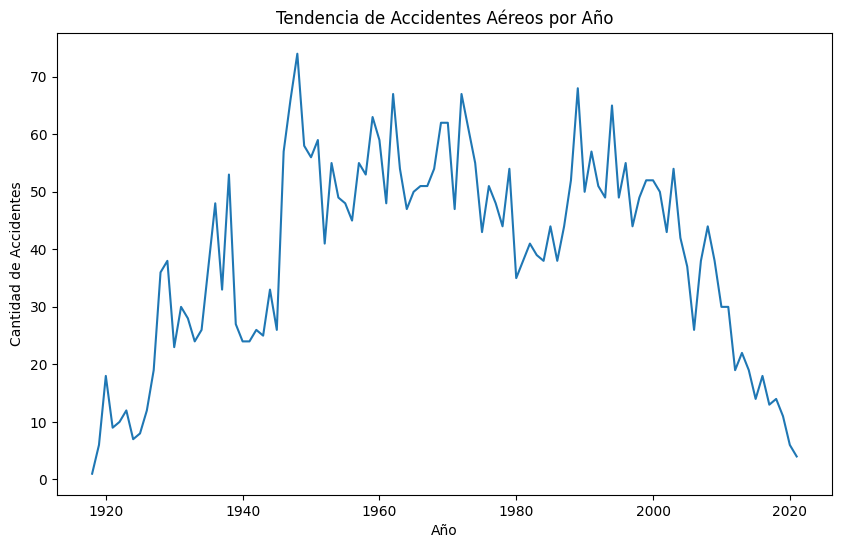

In [77]:
# Tendencia de accidentes a lo largo de los años: Muestra la cantidad de accidentes aéreos por año para identificar cualquier patrón o tendencia a lo largo del tiempo. Puedes usar un gráfico de líneas para visualizar esto:
accidents_by_year = df_clean['year'].value_counts().sort_index()
plt.figure(figsize=(10, 6))
sns.lineplot(x=accidents_by_year.index, y=accidents_by_year.values)
plt.xlabel('Año')
plt.ylabel('Cantidad de Accidentes')
plt.title('Tendencia de Accidentes Aéreos por Año')
plt.show()